In [1]:
import torch
import pandas as pd
import numpy as np
import sys, time

import torch.nn as nn
import torchvision
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
from torchvision.utils import make_grid


import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
import os

In [3]:
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
print(device)

SEED = 999
torch.manual_seed(SEED)
torch.backends.cudnn.deterministic = True

cuda:0


# 1) ETL

In [4]:
imageSize = 100

In [5]:
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Resize((imageSize, imageSize)),
     transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
    ])

In [6]:
DIR = './Plant_leave_diseases_dataset_with_augmentation/'
plantVillDataset = datasets.ImageFolder(DIR, transform=transform)
plantVillDataset

Dataset ImageFolder
    Number of datapoints: 61486
    Root location: ./Plant_leave_diseases_dataset_with_augmentation/
    StandardTransform
Transform: Compose(
               ToTensor()
               Resize(size=(100, 100), interpolation=bilinear, max_size=None, antialias=None)
               Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5))
           )

# 2) EDA

#### Image Sample

In [7]:
classNames = list(plantVillDataset.class_to_idx)

In [8]:
def displayImage(img):
    img = img / 2 + 0.5
    plt.imshow(transforms.ToPILImage()(img))

torch.Size([3, 100, 100])


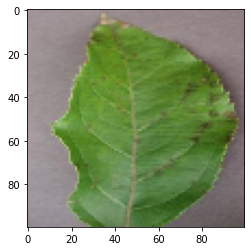

In [9]:
for temp in plantVillDataset:
    print(temp[0].shape)
    displayImage(temp[0])
    break

In [10]:
def show_sample_images(dataset):
    loader = DataLoader(dataset, batch_size = 12, shuffle=True)
    batch = next(iter(loader))
    images, labels = batch
    
    grid = make_grid(images, nrow = 6)
    grid = grid / 2 + 0.5 # unnormalize image
    im_transpose = np.transpose(grid, (1, 2, 0)) 
    plt.figure(figsize=(11, 11))
    plt.imshow(im_transpose)
    print('Encoded Labels: ', labels)
    print('Labels:')
    for label in labels:
        print(classNames[label])

Encoded Labels:  tensor([26, 36, 20, 17, 25,  1, 14, 34, 31, 13,  8,  7])
Labels:
Squash___Powdery_mildew
Tomato___Tomato_Yellow_Leaf_Curl_Virus
Pepper,_bell___healthy
Peach___Bacterial_spot
Soybean___healthy
Apple___Black_rot
Grape___Leaf_blight_(Isariopsis_Leaf_Spot)
Tomato___Spider_mites Two-spotted_spider_mite
Tomato___Late_blight
Grape___Esca_(Black_Measles)
Corn___Cercospora_leaf_spot Gray_leaf_spot
Cherry___healthy


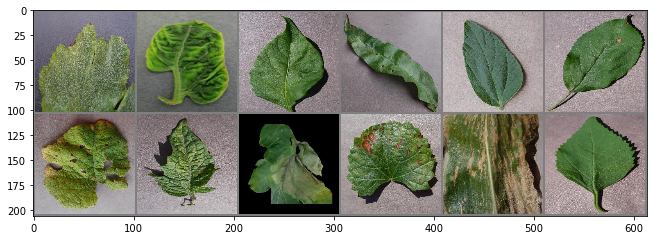

In [11]:
show_sample_images(plantVillDataset)

#### Checking if dataset is balanced

In [12]:
# getting labels/targets
classNames = list(plantVillDataset.class_to_idx)
classNames

['Apple___Apple_scab',
 'Apple___Black_rot',
 'Apple___Cedar_apple_rust',
 'Apple___healthy',
 'Background_without_leaves',
 'Blueberry___healthy',
 'Cherry___Powdery_mildew',
 'Cherry___healthy',
 'Corn___Cercospora_leaf_spot Gray_leaf_spot',
 'Corn___Common_rust',
 'Corn___Northern_Leaf_Blight',
 'Corn___healthy',
 'Grape___Black_rot',
 'Grape___Esca_(Black_Measles)',
 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)',
 'Grape___healthy',
 'Orange___Haunglongbing_(Citrus_greening)',
 'Peach___Bacterial_spot',
 'Peach___healthy',
 'Pepper,_bell___Bacterial_spot',
 'Pepper,_bell___healthy',
 'Potato___Early_blight',
 'Potato___Late_blight',
 'Potato___healthy',
 'Raspberry___healthy',
 'Soybean___healthy',
 'Squash___Powdery_mildew',
 'Strawberry___Leaf_scorch',
 'Strawberry___healthy',
 'Tomato___Bacterial_spot',
 'Tomato___Early_blight',
 'Tomato___Late_blight',
 'Tomato___Leaf_Mold',
 'Tomato___Septoria_leaf_spot',
 'Tomato___Spider_mites Two-spotted_spider_mite',
 'Tomato___Target_Spot'

In [13]:
# counting no. of each label
labels, noOfImagesPerClass = torch.unique(torch.tensor(plantVillDataset.targets), return_counts=True)

In [14]:
classCount =  pd.DataFrame({'class': labels, 'count': noOfImagesPerClass})

In [15]:
classCount.head()

,class,count
0,0,1000
1,1,1000
2,2,1000
3,3,1645
4,4,1143


In [16]:
for index, i in enumerate(range(len(noOfImagesPerClass))):
    print(f"{index} {classNames[i]}: {noOfImagesPerClass[i]}")

0 Apple___Apple_scab: 1000
1 Apple___Black_rot: 1000
2 Apple___Cedar_apple_rust: 1000
3 Apple___healthy: 1645
4 Background_without_leaves: 1143
5 Blueberry___healthy: 1502
6 Cherry___Powdery_mildew: 1052
7 Cherry___healthy: 1000
8 Corn___Cercospora_leaf_spot Gray_leaf_spot: 1000
9 Corn___Common_rust: 1192
10 Corn___Northern_Leaf_Blight: 1000
11 Corn___healthy: 1162
12 Grape___Black_rot: 1180
13 Grape___Esca_(Black_Measles): 1383
14 Grape___Leaf_blight_(Isariopsis_Leaf_Spot): 1076
15 Grape___healthy: 1000
16 Orange___Haunglongbing_(Citrus_greening): 5507
17 Peach___Bacterial_spot: 2297
18 Peach___healthy: 1000
19 Pepper,_bell___Bacterial_spot: 1000
20 Pepper,_bell___healthy: 1478
21 Potato___Early_blight: 1000
22 Potato___Late_blight: 1000
23 Potato___healthy: 1000
24 Raspberry___healthy: 1000
25 Soybean___healthy: 5090
26 Squash___Powdery_mildew: 1835
27 Strawberry___Leaf_scorch: 1109
28 Strawberry___healthy: 1000
29 Tomato___Bacterial_spot: 2127
30 Tomato___Early_blight: 1000
31 Tomat

<AxesSubplot:xlabel='class', ylabel='count'>

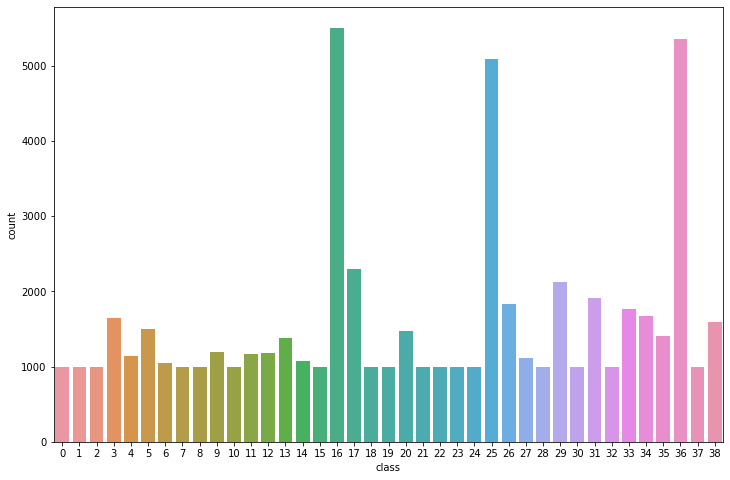

In [17]:
plt.figure(figsize=(12, 8))
sns.barplot(x = 'class', y='count', data = classCount)

<b>Note:</b> labels 16 - Orange___Haunglongbing_(Citrus_greening), 25 - Soybean___healthy, and 36 - Tomato___Tomato_Yellow_Leaf_Curl_Virus have way more samples than other labels.

#### Reducing Samples for labels 16, 25, and 36

https://discuss.pytorch.org/t/how-to-sample-images-belonging-to-particular-classes/43776/5

In [18]:
# Mean of total samples for each label excluding 16, 25, and 36
meanCount = int(classCount.sort_values(by=['count'], ascending=False)[4:].mean()[1])
meanCount

1235

In [19]:
indices_to_keep = []
targets = torch.tensor(plantVillDataset.targets)
for label in labels:    
    if label == 16 or label == 25 or label == 36:
        permIndex = torch.randperm(len(targets))
        samples = (targets == label).nonzero()
        indices_to_keep.extend(samples[:meanCount])
    else:
        indices_to_keep.extend((targets == label).nonzero())

In [20]:
plantVillDatasetBalanced = torch.utils.data.Subset(plantVillDataset, indices_to_keep)

#### Checking label count again

In [21]:
from collections import Counter

In [22]:
print(Counter(plantVillDataset.targets[i] for i in indices_to_keep))

Counter({17: 2297, 29: 2127, 31: 1909, 26: 1835, 33: 1771, 34: 1676, 3: 1645, 38: 1591, 5: 1502, 20: 1478, 35: 1404, 13: 1383, 16: 1235, 25: 1235, 36: 1235, 9: 1192, 12: 1180, 11: 1162, 4: 1143, 27: 1109, 14: 1076, 6: 1052, 0: 1000, 1: 1000, 2: 1000, 7: 1000, 8: 1000, 10: 1000, 15: 1000, 18: 1000, 19: 1000, 21: 1000, 22: 1000, 23: 1000, 24: 1000, 28: 1000, 30: 1000, 32: 1000, 37: 1000})


In [23]:
classCount = Counter(plantVillDataset.targets[i] for i in indices_to_keep)

In [24]:
labels, count = [], []
for i in range(len(classCount)):
    labels.append(i)
    count.append(classCount[i])

In [25]:
classCount = pd.DataFrame({'class': labels, 'count': count})

<AxesSubplot:xlabel='class', ylabel='count'>

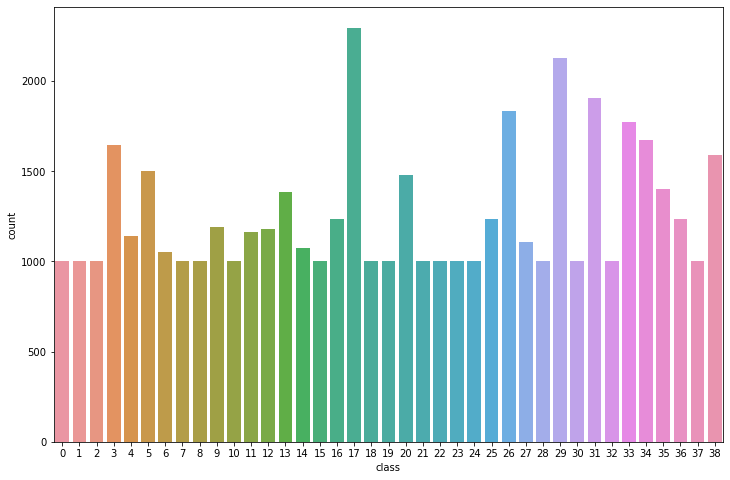

In [26]:
plt.figure(figsize=(12, 8))
sns.barplot(x = 'class', y='count', data = classCount)

<b>Note:</b> Classes are more balanced now.

In [27]:
# Total data samples after reducation
len(plantVillDatasetBalanced)

49237

# 3) Train Val Test Split

In [28]:
train_set, test_set = torch.utils.data.random_split(plantVillDatasetBalanced, [39237, 10000])
train_set, val_set = torch.utils.data.random_split(train_set, [30000, 9237])

In [29]:
batch_size = 50

train_loader = DataLoader(train_set, batch_size, shuffle=True, num_workers=2, pin_memory=True)
# val_loader = DataLoader(val_set, len(val_set), shuffle=True)
# test_loader = DataLoader(test_set, len(test_set), shuffle=True)
val_loader = DataLoader(val_set, batch_size, shuffle=True, num_workers=2, pin_memory=True)
test_loader = DataLoader(test_set, batch_size, shuffle=True, num_workers=2, pin_memory=True)

# Transfer Learning

In [33]:
from torchvision import models
from torchvision.models import AlexNet_Weights

### Train model

In [34]:
class EarlyStopping():
    def __init__(self, patience, threshold):
        self.patience      = 5
        self.threshold     = 0.1
        self.prev_val_loss = None
        self.patienceCount = 0
        
    def _checkPatience(self,):
        if self.patienceCount == self.patience:
            return True
        else:
            self.patienceCount += 1
            return False
    
    def checkCondition(self, val_loss):
        if self.prev_val_loss == None:
            self.prev_val_loss = val_loss
        elif val_loss - self.prev_val_loss > self.threshold:
            return self._checkPatience()
        
        self.patienceCount = 0
        return False

In [35]:
def train(model, optimizer, J_fn, filepath, epochs=10, patience = 5, threshold = 0.1):
    
    earlyStopping = EarlyStopping(patience, threshold)
    
    val_old_loss = float("Inf")
    train_losses = []
    train_accs   = []
    avg_train_losses_per_epoch = []
    avg_train_accs_per_epoch   = []
    val_losses   = []
    val_accs     = []
    training_time = []
    training_time_per_epoch = []
    
    for e in range(epochs):
        total_corr       = 0
        total_loss       = 0
        total_train_loss = 0
        total_time_epoch = 0
        for b, (image, label) in enumerate(train_loader):
            start_time = time.time()

            image = image.to(device)
            label = label.to(device)

            yhat = model(image)
            train_loss = J_fn(yhat, label)
            total_train_loss += train_loss

            train_losses.append(train_loss)
            predicted = torch.max(yhat, 1)[1]
            batch_corr = (predicted == label).sum()
            total_corr += batch_corr

            optimizer.zero_grad()
            train_loss.backward()
            optimizer.step()

            train_acc = (total_corr * 100) / (batch_size * (b + 1))
            train_accs.append(train_acc)

            total_time = time.time() - start_time
            total_time_epoch += total_time
            training_time.append(total_time)

            if (b+1) % 50 == 0:
                print(f"Epoch: {e + 1} - Batch: {b + 1} - Train Loss: {train_loss:.2f} - Train Acc: {train_acc:.2f} - Total Time: {total_time:.2f}s")
                # print("Loss Gradient for first Conv Layer: ", torch.mean(model.conv1.weight.grad) )
        
        avg_train_time = total_time_epoch / len(train_loader)
        training_time_per_epoch.append(avg_train_time)
        
        avg_train_loss = total_train_loss / len(train_loader)   
        avg_train_acc  = (total_corr * 100) / len(train_set)
        
        avg_train_losses_per_epoch.append(avg_train_loss)
        avg_train_accs_per_epoch.append(avg_train_acc)
        
        print(f"++++++End of Epoch {e + 1} ++++++ Avg Train Loss: {avg_train_loss:.2f} - Avg Train Acc: {avg_train_acc:.2f} - Avg Train Time: {avg_train_time:.2f}")

        with torch.no_grad():
            val_corr       = 0 
            total_val_loss = 0
            for val_image, val_label in val_loader:
                val_image = val_image.to(device)
                val_label = val_label.to(device)
                val_yhat = model(val_image)
                val_loss = J_fn(val_yhat, val_label)
                total_val_loss += val_loss
                val_predicted = torch.max(val_yhat, 1)[1]
                val_corr += (val_predicted == val_label).sum()
            val_acc = (val_corr * 100) / len(val_set)
            avg_val_loss = total_val_loss / len(val_loader)
            val_accs.append(val_acc)
            val_losses.append(val_loss)
            
            if avg_val_loss < val_old_loss:
                val_old_loss = avg_val_loss
                saveObject = {
                    'epoch': e + 1,
                    'batch': b + 1,
                    'train_loss': avg_train_loss,
                    'train_acc': avg_train_acc,
                    'val_loss': avg_val_loss,
                    'val_acc': val_acc,
                    'model_state_dict': model.state_dict(),
                    'optimizer_state_dict': optimizer.state_dict(),
                }
                torch.save(saveObject, filepath)
            
        if earlyStopping.checkCondition(avg_val_loss):
            break
            
        print(f"++++++Validation++++++ Val Loss: {avg_val_loss:.2f} - Val Acc: {val_acc:.2f}")
        
    train_losses               = torch.Tensor(train_losses).cpu()
    avg_train_losses_per_epoch = torch.Tensor(avg_train_losses_per_epoch).cpu()
    train_accs                 = torch.Tensor(train_accs).cpu()
    avg_train_accs_per_epoch   = torch.Tensor(avg_train_accs_per_epoch).cpu()
    val_losses                 = torch.Tensor(val_losses).cpu() 
    val_accs                   = torch.Tensor(val_accs).cpu()
    
        
    return train_losses, avg_train_losses_per_epoch, train_accs, avg_train_accs_per_epoch, training_time, training_time_per_epoch, val_losses, val_accs

### Alexnet

In [36]:
alexnet = models.alexnet(weights=AlexNet_Weights.IMAGENET1K_V1).to(device)
alexnet 

AlexNet(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(11, 11), stride=(4, 4), padding=(2, 2))
    (1): ReLU(inplace=True)
    (2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (3): Conv2d(64, 192, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (4): ReLU(inplace=True)
    (5): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (6): Conv2d(192, 384, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU(inplace=True)
    (8): Conv2d(384, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): ReLU(inplace=True)
    (10): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (avgpool): AdaptiveAvgPool2d(output_size=(6, 6))
  (classifier): Sequential(
    (0): Dropout(p=0.5, inplace=False)
    (1): Linear(in_features=9216, out_features=4096, bias=True)
 

In [37]:
for param in alexnet.parameters():
    param.requires_grad=False 

alexnet.classifier = nn.Sequential(
    nn.Linear(9216, 1024),
    nn.ReLU(),
    nn.Dropout(0.4),
    nn.Linear(1024, 700),
    nn.ReLU(),
    nn.Dropout(0.4),
    nn.Linear(700, 400),
    nn.ReLU(),
    nn.Dropout(0.4),
    nn.Linear(400, 39)
)

alexnet = alexnet.to(device)

In [38]:
random_image = torch.rand((50, 3, 100, 100)).to(device)
out = alexnet(random_image)
print(out.shape)

torch.Size([50, 39])


In [39]:
J_fn = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(alexnet.parameters(), lr=0.001)

In [40]:
filepath4 = './ModelParameter/Transfer Learning/alexnetbestModelPara.pt'

#### Train

In [41]:
train_lossesTF, avg_train_losses_per_epochTF, train_accsTF, avg_train_accs_per_epochTF, training_timeTF, training_time_per_epochTF, val_lossesTF, val_accsTF = train(alexnet, optimizer, J_fn, filepath4, 35)

Epoch: 1 - Batch: 50 - Train Loss: 2.98 - Train Acc: 13.20 - Total Time: 0.05s
Epoch: 1 - Batch: 100 - Train Loss: 2.29 - Train Acc: 24.42 - Total Time: 0.05s
Epoch: 1 - Batch: 150 - Train Loss: 1.59 - Train Acc: 31.76 - Total Time: 0.01s
Epoch: 1 - Batch: 200 - Train Loss: 1.85 - Train Acc: 36.50 - Total Time: 0.01s
Epoch: 1 - Batch: 250 - Train Loss: 1.63 - Train Acc: 40.29 - Total Time: 0.05s
Epoch: 1 - Batch: 300 - Train Loss: 0.90 - Train Acc: 43.25 - Total Time: 0.10s
Epoch: 1 - Batch: 350 - Train Loss: 1.30 - Train Acc: 45.57 - Total Time: 0.05s
Epoch: 1 - Batch: 400 - Train Loss: 1.10 - Train Acc: 47.28 - Total Time: 0.05s
Epoch: 1 - Batch: 450 - Train Loss: 1.32 - Train Acc: 48.97 - Total Time: 0.06s
Epoch: 1 - Batch: 500 - Train Loss: 1.02 - Train Acc: 50.40 - Total Time: 0.05s
Epoch: 1 - Batch: 550 - Train Loss: 1.39 - Train Acc: 51.73 - Total Time: 0.03s
Epoch: 1 - Batch: 600 - Train Loss: 0.95 - Train Acc: 52.86 - Total Time: 0.05s
++++++End of Epoch 1 ++++++ Avg Train Los

### Load training history from saved file

In [42]:
# loadObject = torch.load('./ModelParameter/Transfer Learning/alexnetTrainingHist.pt')

In [43]:
# if os.path.exists('./ModelParameter/Model 2/Model2TrainingHist.pt')
    # train_lossesTF = loadObject['train_losses']
    # avg_train_losses_per_epochTF = loadObject['avg_train_losses_per_epoch']
    # train_accsTF = loadObject['train_accs']
    # avg_train_accs_per_epochTF = loadObject['avg_train_accs_per_epoch']
    # training_timeTF = loadObject['training_time']
    # training_time_per_epochTF = loadObject['training_time_per_epoch']
    # val_lossesTF = loadObject['val_losses']
    # val_accsTF = loadObject['val_accs']
# else:
#     print("Currently, training history is not saved.")

### Plotting Loss

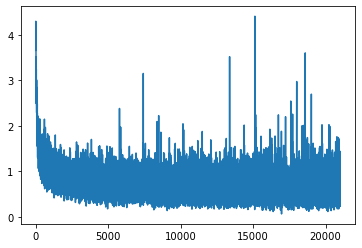

In [44]:
plt.plot(train_lossesTF)

In [45]:
def plotLoss(trainingLoss, valLoss):
    plt.plot(trainingLoss)
    plt.plot(valLoss)
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.legend(["Training Loss", "Val Loss"])

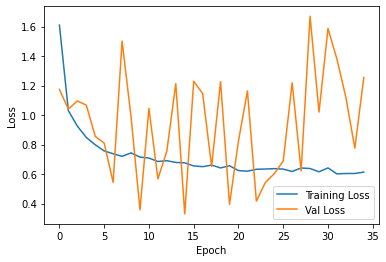

In [46]:
plotLoss(avg_train_losses_per_epochTF, val_lossesTF)

### Plotting Acccuracy

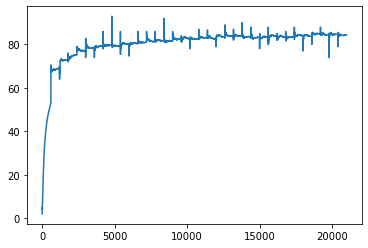

In [47]:
plt.plot(train_accsTF)

In [48]:
def plotAccuracy(trainingAcc, valAcc):
    plt.plot(trainingAcc)
    plt.plot(valAcc)
    plt.xlabel("Epoch")
    plt.ylabel("Accuracy (%)")
    plt.legend(["Training Accuracy", "Val Accuracy"])

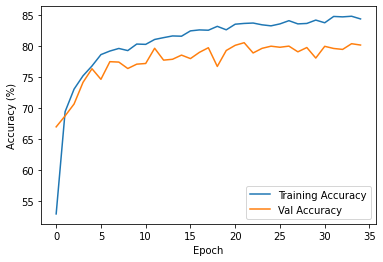

In [49]:
plotAccuracy(avg_train_accs_per_epochTF, val_accsTF)

### Plotting Training Time

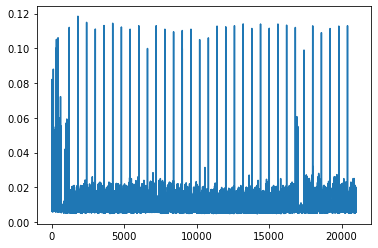

In [50]:
plt.plot(training_timeTF)

In [51]:
def plotTrainingTime(training_time):
    plt.plot(training_time)
    plt.xlabel("Epoch")
    plt.ylabel("Training Time (s)")

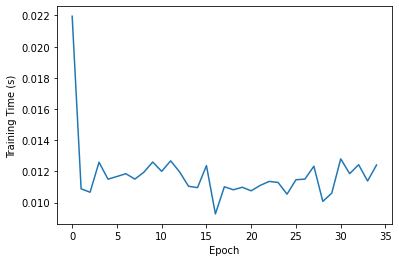

In [52]:
plotTrainingTime(training_time_per_epochTF)

In [53]:
saveObject = {
    'train_losses': train_lossesTF,
    'avg_train_losses_per_epoch': avg_train_losses_per_epochTF,
    'train_accs': train_accsTF,
    'avg_train_accs_per_epoch': avg_train_accs_per_epochTF,
    'training_time': training_timeTF,
    'training_time_per_epoch': training_time_per_epochTF,
    'val_losses': val_lossesTF,
    'val_accs': val_accsTF
}

torch.save(saveObject, './ModelParameter/Transfer Learning/alexnetTrainingHist.pt')

### Resnet

In [54]:
from torchvision.models import ResNet18_Weights

In [55]:
resnet = models.resnet18(weights=ResNet18_Weights.IMAGENET1K_V1).to(device)
resnet 

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [56]:
for param in resnet.parameters():
    param.requires_grad=False #this is essentially freezing all the weights

resnet.fc = nn.Linear(512, 39)

resnet = resnet.to(device)

In [57]:
random_image = torch.rand((50, 3, 100, 100)).to(device)
out = resnet(random_image)
print(out.shape)

torch.Size([50, 39])


In [58]:
J_fn = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(resnet.parameters(), lr=0.001)

In [59]:
filepath5 = './ModelParameter/Transfer Learning/resnetbestModelPara.pt'

In [60]:
train_lossesTF2, avg_train_losses_per_epochTF2, train_accsTF2, avg_train_accs_per_epochTF2, training_timeTF2, training_time_per_epochTF2, val_lossesTF2, val_accsTF2 = train(resnet, optimizer, J_fn, filepath5, 35)

Epoch: 1 - Batch: 50 - Train Loss: 2.26 - Train Acc: 27.28 - Total Time: 0.02s
Epoch: 1 - Batch: 100 - Train Loss: 1.32 - Train Acc: 44.86 - Total Time: 0.01s
Epoch: 1 - Batch: 150 - Train Loss: 1.26 - Train Acc: 53.76 - Total Time: 0.01s
Epoch: 1 - Batch: 200 - Train Loss: 0.80 - Train Acc: 58.90 - Total Time: 0.01s
Epoch: 1 - Batch: 250 - Train Loss: 0.92 - Train Acc: 63.02 - Total Time: 0.01s
Epoch: 1 - Batch: 300 - Train Loss: 0.97 - Train Acc: 65.61 - Total Time: 0.01s
Epoch: 1 - Batch: 350 - Train Loss: 0.75 - Train Acc: 67.57 - Total Time: 0.01s
Epoch: 1 - Batch: 400 - Train Loss: 0.92 - Train Acc: 69.17 - Total Time: 0.01s
Epoch: 1 - Batch: 450 - Train Loss: 0.64 - Train Acc: 70.48 - Total Time: 0.01s
Epoch: 1 - Batch: 500 - Train Loss: 0.67 - Train Acc: 71.69 - Total Time: 0.01s
Epoch: 1 - Batch: 550 - Train Loss: 0.37 - Train Acc: 72.67 - Total Time: 0.01s
Epoch: 1 - Batch: 600 - Train Loss: 0.50 - Train Acc: 73.42 - Total Time: 0.01s
++++++End of Epoch 1 ++++++ Avg Train Los

### Load training history from saved file

In [61]:
# loadObject = torch.load('./ModelParameter/Transfer Learning/resnetTrainingHist.pt')

In [62]:
# if os.path.exists('./ModelParameter/Model 2/Model2TrainingHist.pt')
    # train_lossesTF2 = loadObject['train_losses']
    # avg_train_losses_per_epochTF2 = loadObject['avg_train_losses_per_epoch']
    # train_accsTF2 = loadObject['train_accs']
    # avg_train_accs_per_epochTF2 = loadObject['avg_train_accs_per_epoch']
    # training_timeTF2 = loadObject['training_time']
    # training_time_per_epochTF2 = loadObject['training_time_per_epoch']
    # val_lossesTF2 = loadObject['val_losses']
    # val_accsTF2 = loadObject['val_accs']
# else:
#     print("Currently, training history is not saved.")

### Plotting Loss

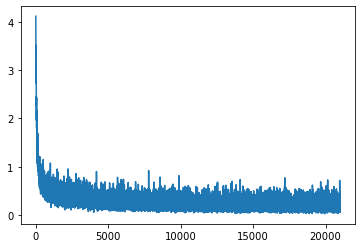

In [63]:
plt.plot(train_lossesTF2)

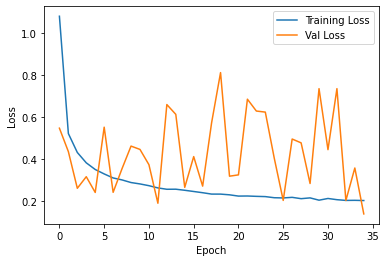

In [64]:
plotLoss(avg_train_losses_per_epochTF2, val_lossesTF2)

### Plotting Acccuracy

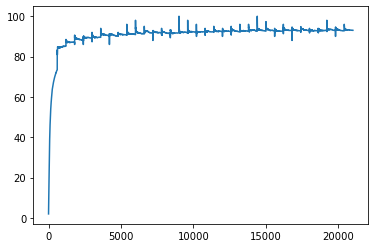

In [65]:
plt.plot(train_accsTF2)

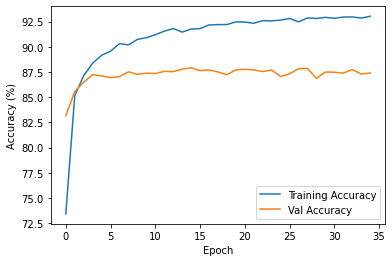

In [66]:
plotAccuracy(avg_train_accs_per_epochTF2, val_accsTF2)

### Plotting Training Time

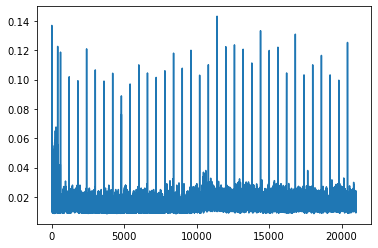

In [67]:
plt.plot(training_timeTF2)

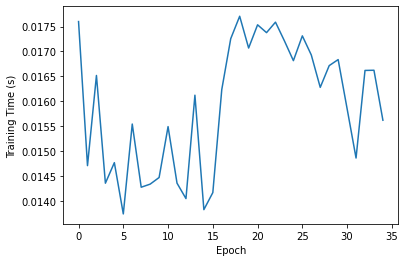

In [68]:
plotTrainingTime(training_time_per_epochTF2)

In [69]:
saveObject = {
    'train_losses': train_lossesTF2,
    'avg_train_losses_per_epoch': avg_train_losses_per_epochTF2,
    'train_accs': train_accsTF2,
    'avg_train_accs_per_epoch': avg_train_accs_per_epochTF2,
    'training_time': training_timeTF2,
    'training_time_per_epoch': training_time_per_epochTF2,
    'val_losses': val_lossesTF2,
    'val_accs': val_accsTF2
}

torch.save(saveObject, './ModelParameter/Transfer Learning/resnetTrainingHist.pt')

## Test Fine-Tuned Models

In [70]:
checkpoint4 = torch.load(filepath4)
checkpoint5 = torch.load(filepath5)

In [71]:
bestModel4 = models.alexnet().to(device)
bestModel4.classifier = nn.Sequential(
    nn.Linear(9216, 1024),
    nn.ReLU(),
    nn.Dropout(0.4),
    nn.Linear(1024, 700),
    nn.ReLU(),
    nn.Dropout(0.4),
    nn.Linear(700, 400),
    nn.ReLU(),
    nn.Dropout(0.4),
    nn.Linear(400, 39)
)

bestModel4 = bestModel4.to(device)

In [72]:
bestModel5 = models.resnet18().to(device)
bestModel5.fc = nn.Linear(512, 39)
bestModel5 = bestModel5.to(device)


In [73]:
bestModel4.load_state_dict(checkpoint4['model_state_dict'])
bestModel5.load_state_dict(checkpoint5['model_state_dict'])

<All keys matched successfully>

In [74]:
bestModel4.eval()
bestModel5.eval()

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [75]:
def testModel(model):
    with torch.no_grad():
        correct = 0
        acc     = 0
        total   = 0
        allPrediction       = []
        correctLabels       = []
        misclassifiedLabels = []
        
        for images, targets in test_loader:
            images  = images.to(device)
            targets = targets.to(device)                  

            yhat    = model(images)
            predicted = torch.max(yhat, 1)[1] 
            batch_corr = (predicted == targets).sum()
            correct   += batch_corr
            total     += targets.shape[0]
            
            for i in range(len(predicted)):
                if predicted[i] != targets[i]:
                    misclassifiedLabels.append({
                        'correctLabel': targets[i],
                        'predicted': predicted[i],
                        'image': images[i]
                    })

            allPrediction.append(predicted)
            correctLabels.append(targets)

        acc = 100 * correct / total
        print(f"Accuracy: {acc:.2f}")
        
        return allPrediction, correctLabels, misclassifiedLabels

### Accuracy of Alexnet Model

In [76]:
allPredictionAlexnet, correctLabelsAlexnet, misclassifiedLabelsAlexnet = testModel(bestModel4)

Accuracy: 85.02


### Accuracy of Resnet Model

In [77]:
allPredictionResnet, correctLabelsResnet, misclassifiedLabelsResnet = testModel(bestModel5)

Accuracy: 88.35


## Display Confusion Matrix

In [78]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

#### Alexnet Model

In [79]:
allPredictionTensorAlexnet = allPredictionAlexnet[0]
correctLabelsTensorAlexnet = correctLabelsAlexnet[0]

In [80]:
for i in range(1, len(allPredictionAlexnet)):
    allPredictionTensorAlexnet = torch.cat((allPredictionTensorAlexnet, allPredictionAlexnet[i]))
    
for i in range(1, len(correctLabelsAlexnet)):
    correctLabelsTensorAlexnet = torch.cat((correctLabelsTensorAlexnet, correctLabelsAlexnet[i]))

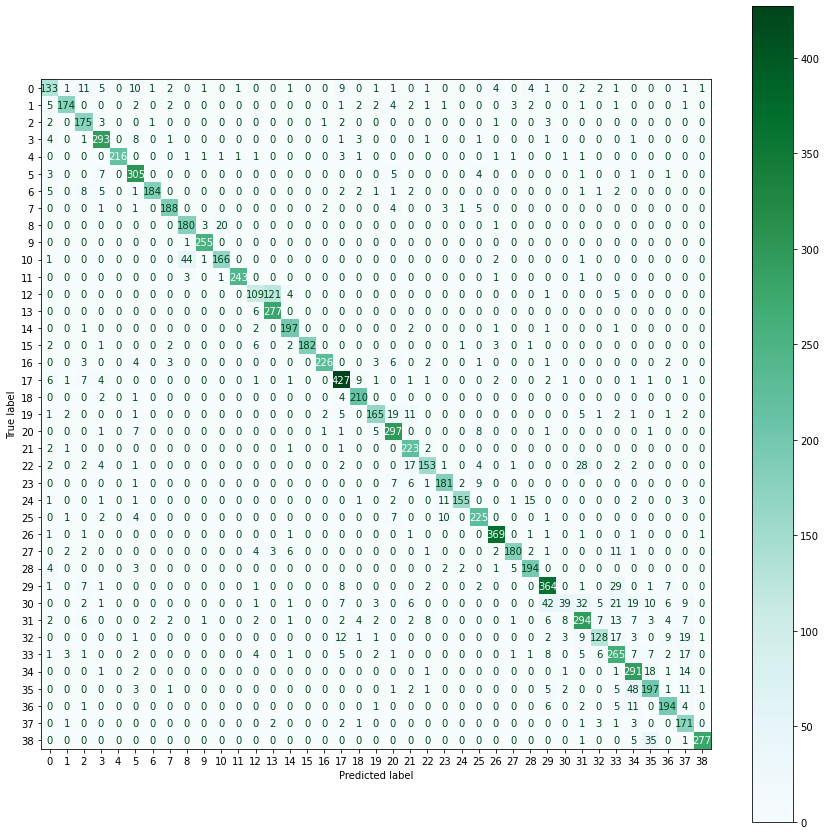

In [81]:
confusion_matrix_report_Alexnet = confusion_matrix(correctLabelsTensorAlexnet.cpu(), allPredictionTensorAlexnet.cpu())
disp = ConfusionMatrixDisplay(confusion_matrix_report_Alexnet)
fig, ax = plt.subplots(figsize=(15,15))
disp.plot(ax=ax, cmap='BuGn')

#### Resnet Model

In [82]:
allPredictionTensorResnet = allPredictionResnet[0]
correctLabelsTensorResnet = correctLabelsResnet[0]

In [83]:
for i in range(1, len(allPredictionResnet)):
    allPredictionTensorResnet = torch.cat((allPredictionTensorResnet, allPredictionResnet[i]))
    
for i in range(1, len(correctLabelsResnet)):
    correctLabelsTensorResnet = torch.cat((correctLabelsTensorResnet, correctLabelsResnet[i]))

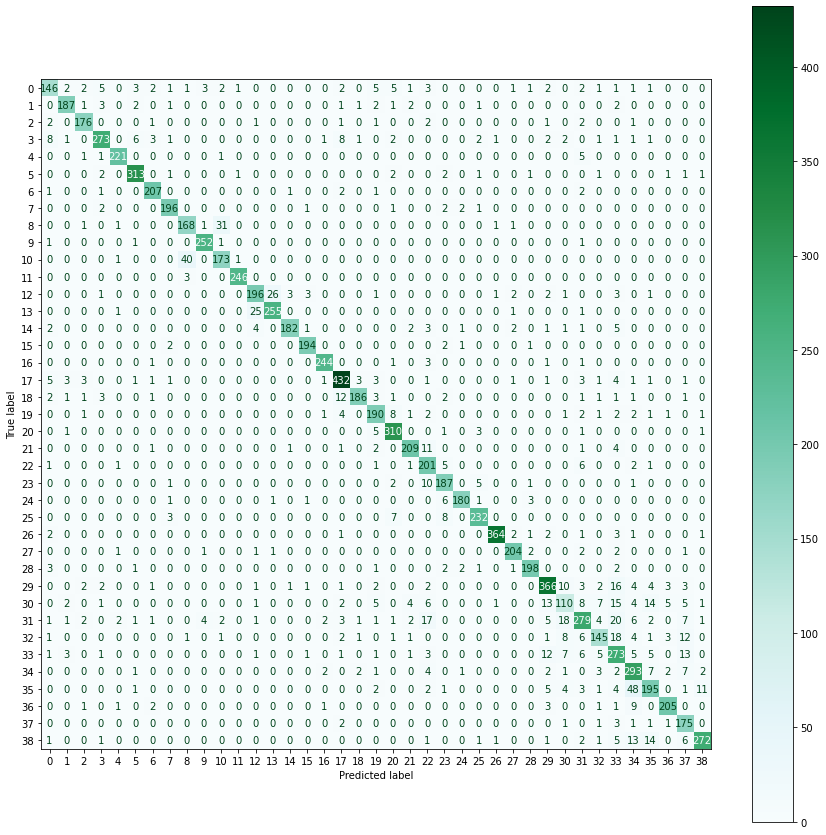

In [84]:
confusion_matrix_report_Resnet = confusion_matrix(correctLabelsTensorResnet.cpu(), allPredictionTensorResnet.cpu())
disp = ConfusionMatrixDisplay(confusion_matrix_report_Resnet)
fig, ax = plt.subplots(figsize=(15,15))
disp.plot(ax=ax, cmap='BuGn')

# Examining Misclassified Labels

## Prediction Accuracy Per Label

In [85]:
def count_misclassified_images_per_label(confusion_matrix_report):
    total_number_misclassified_labels = []
    misclassified_labels_percentage   = []
    for i in range(len(confusion_matrix_report)):
        total_label_misclassified = sum(confusion_matrix_report[i][:i]) + sum(confusion_matrix_report[i][i + 1:])
        total_number_misclassified_labels.append(total_label_misclassified)
        
        total_no_of_label            = sum(confusion_matrix_report[i])
        label_classfication_accuracy = 100 * confusion_matrix_report[i][i] / total_no_of_label
        misclassified_labels_percentage.append(label_classfication_accuracy)
    return total_number_misclassified_labels, misclassified_labels_percentage

In [86]:
def top_misclassified_predicted_labels(confusion_matrix_report, labels):
    top_three_misclassifications_per_label = {}
    for label in labels:
        sorted_indices       = np.argsort(confusion_matrix_report[label])
        top_three_mislabeled = np.argsort(confusion_matrix_report[label])[-4:-1]
        
        top_three_misclassifications_per_label[label] = top_three_mislabeled
    
    return top_three_misclassifications_per_label

In [87]:
def plot_misclassified_images_per_labels(misclassified_images_per_labels, label_prediction_accuracy, title1, title2, labels):
    plt.figure(figsize=(12,6))
    plt.bar(labels, misclassified_images_per_labels)
    plt.xlabel("Labels")
    plt.ylabel("No of Missclassifications")
    plt.title(title1)
    plt.show()
    
    plt.figure(figsize=(12,6))
    plt.bar(labels, label_prediction_accuracy)
    plt.xlabel("Labels")
    plt.ylabel("Prediction Accuracy")
    plt.title(title2)
    plt.show()

In [88]:
def show_misclassified_images_per_labels(label, top_3_mislabeled, misclassifiedLabels):
    if label not in top_3_mislabeled:
        print("Please choose one of top three misclassified labels")
        return
    
    count = 0
    images = torch.Tensor([])
    for Images, targets in test_loader:
        for i in range(len(targets)):
            if targets[i] == label and count < 12:
                image = torch.Tensor(Images[i]).cpu().reshape(1, 3, 100, 100)
                images = torch.cat((images, image))
                count += 1
        if count == 6:
            break
            
    grid = make_grid(images, nrow = 6)
    grid = grid / 2 + 0.5 # unnormalize image
    im_transpose = np.transpose(grid, (1, 2, 0))
    plt.figure(figsize=(11, 11))
    plt.title(f"Correct Label: {label} {classNames[label]}")
    plt.imshow(im_transpose)

    for incorrect_label in reversed(top_3_mislabeled[label]):
        images = torch.Tensor([])
        count = 0
        for misclassifiedLabel in misclassifiedLabels:
            if misclassifiedLabel['correctLabel'] == incorrect_label:
                image = torch.Tensor(misclassifiedLabel['image']).cpu().reshape(1, 3, 100, 100)
                images = torch.cat((images, image))
                count += 1

            if count == 6:
                break
        
        grid = make_grid(images, nrow = 6)
        grid = grid / 2 + 0.5 # unnormalize image
        im_transpose = np.transpose(grid, (1, 2, 0))
        plt.figure(figsize=(11, 11))
        plt.title(f"Misclassified Label: {incorrect_label} {classNames[incorrect_label]}")
        plt.imshow(im_transpose)

In [89]:
def list_top_3_mislabeled_count(low_accuracy_labels, top_3_mislabeled, confusion_matrix_report):
    for label in low_accuracy_labels:
        print(f"For label {label}, {classNames[label]}, top three misclassified labels are:")
        for mislabeled in reversed(top_3_mislabeled[label]):
            mislabeled_count = confusion_matrix_report[label][mislabeled]
            print(f"---> Mislabeled: {mislabeled} {classNames[mislabeled]}")
            print("Count:", mislabeled_count)
        print("")

In [90]:
def show_misclassified_images(misclassifiedLabels):
    misses         = torch.Tensor([])
    correctLabels   = torch.Tensor([])
    images = torch.Tensor([])
    
    for i in range(12):
        miss = torch.Tensor(misclassifiedLabels[i]['correctLabel']).cpu().reshape(1)
        misses = torch.cat((misses, miss)).to(torch.int)
        
        correctLabel = torch.Tensor(misclassifiedLabels[i]['predicted']).cpu().reshape(1)
        correctLabels = torch.cat((correctLabels, correctLabel)).to(torch.int)
        
        image = torch.Tensor(misclassifiedLabels[i]['image']).cpu().reshape(1, 3, 100, 100)
        images = torch.cat((images, image))
        
    print("Correct Labels:  ", correctLabels)
    print("Predicted Labels:", misses, end="\n\n")
    
    grid = make_grid(images, nrow = 6)
    grid = grid / 2 + 0.5 # unnormalize image
    im_transpose = np.transpose(grid, (1, 2, 0)) 
    plt.figure(figsize=(11, 11))
    plt.imshow(im_transpose)
    
    for i in range(len(correctLabels)):
        print(f"Correct Label: {correctLabels[i]} --> {classNames[correctLabels[i]]}")
        print(f"Predicted Label: {misses[i]} --> {classNames[misses[i]]}", end="\n\n")

#### Alexnet

In [91]:
print("Total Misclassified Images:", len(misclassifiedLabelsAlexnet))

Total Misclassified Images: 1498


In [92]:
misclassified_images_per_labelsAlexnet, label_prediction_accuracyAlexnet = count_misclassified_images_per_label(confusion_matrix_report_Alexnet)

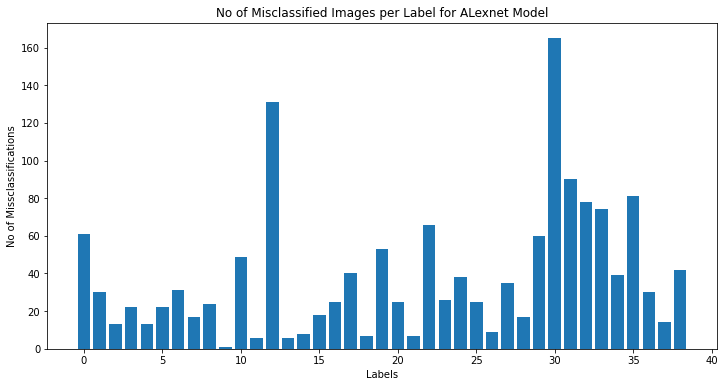

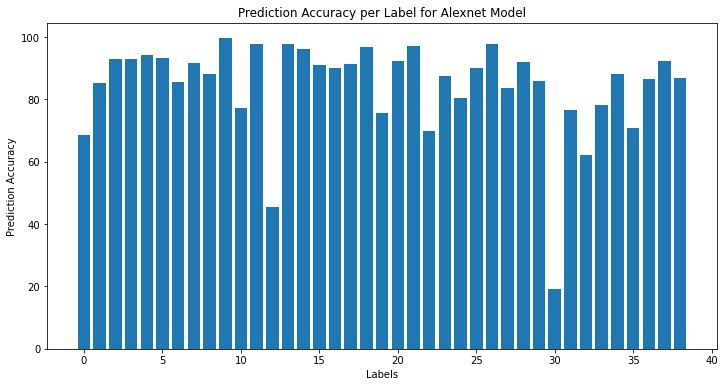

In [93]:
plot_misclassified_images_per_labels(misclassified_images_per_labelsAlexnet, label_prediction_accuracyAlexnet, "No of Misclassified Images per Label for ALexnet Model",
                                     "Prediction Accuracy per Label for Alexnet Model", labels)

<b>Note:</b> Low accuracy prediction on labels 0, 10, 12, 22, 30, 32, and 35

In [94]:
print(0, classNames[0])
print(10, classNames[10])
print(12, classNames[12])
print(22, classNames[22])
print(30, classNames[30])
print(32, classNames[32])
print(35, classNames[35])

0 Apple___Apple_scab
10 Corn___Northern_Leaf_Blight
12 Grape___Black_rot
22 Potato___Late_blight
30 Tomato___Early_blight
32 Tomato___Leaf_Mold
35 Tomato___Target_Spot


#### Resnet

In [95]:
print("Total Misclassified Images:", len(misclassifiedLabelsResnet))

Total Misclassified Images: 1165


In [96]:
misclassified_images_per_labelsResnet, label_prediction_accuracyResnet = count_misclassified_images_per_label(confusion_matrix_report_Resnet)

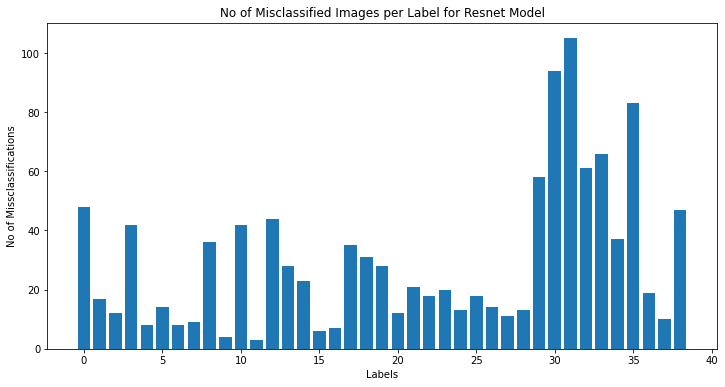

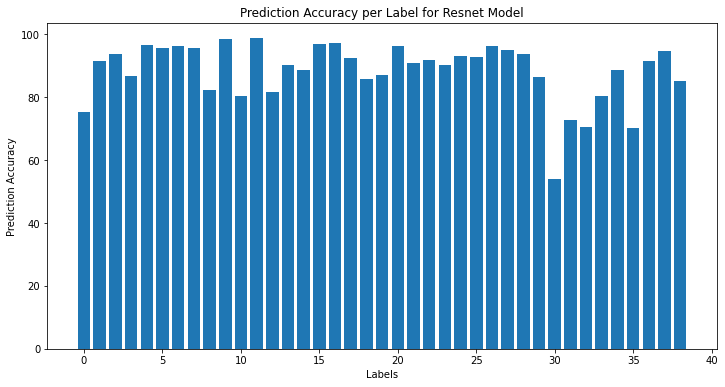

In [97]:
plot_misclassified_images_per_labels(misclassified_images_per_labelsResnet, label_prediction_accuracyResnet, "No of Misclassified Images per Label for Resnet Model",
                                     "Prediction Accuracy per Label for Resnet Model", labels)

<b>Note:</b> Low accuracy prediction on labels 0, 30, 31, 32, and 35

In [98]:
print(0, classNames[0])
print(30, classNames[30])
print(31, classNames[31])
print(32, classNames[32])
print(35, classNames[35])

0 Apple___Apple_scab
30 Tomato___Early_blight
31 Tomato___Late_blight
32 Tomato___Leaf_Mold
35 Tomato___Target_Spot


## Examining Misclassified Images

#### Alexnet

Correct Labels:   tensor([29, 12, 31, 34, 21, 23, 13, 36, 35, 34, 31, 13], dtype=torch.int32)
Predicted Labels: tensor([36, 14, 30, 32, 30, 24, 12, 30, 38, 35, 30, 12], dtype=torch.int32)

Correct Label: 29 --> Tomato___Bacterial_spot
Predicted Label: 36 --> Tomato___Tomato_Yellow_Leaf_Curl_Virus

Correct Label: 12 --> Grape___Black_rot
Predicted Label: 14 --> Grape___Leaf_blight_(Isariopsis_Leaf_Spot)

Correct Label: 31 --> Tomato___Late_blight
Predicted Label: 30 --> Tomato___Early_blight

Correct Label: 34 --> Tomato___Spider_mites Two-spotted_spider_mite
Predicted Label: 32 --> Tomato___Leaf_Mold

Correct Label: 21 --> Potato___Early_blight
Predicted Label: 30 --> Tomato___Early_blight

Correct Label: 23 --> Potato___healthy
Predicted Label: 24 --> Raspberry___healthy

Correct Label: 13 --> Grape___Esca_(Black_Measles)
Predicted Label: 12 --> Grape___Black_rot

Correct Label: 36 --> Tomato___Tomato_Yellow_Leaf_Curl_Virus
Predicted Label: 30 --> Tomato___Early_blight

Correct Label:

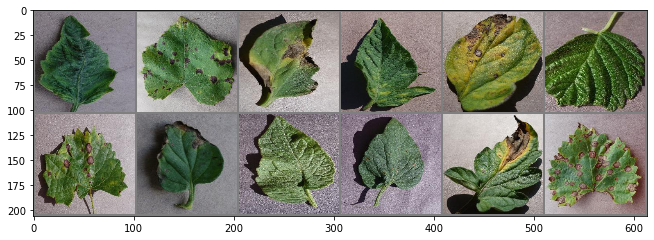

In [99]:
show_misclassified_images(misclassifiedLabelsAlexnet)

In [100]:
low_accuracy_labels = [0, 10, 12, 22, 30, 32, 35]

In [101]:
top_3_mislabeledAlexnet = top_misclassified_predicted_labels(confusion_matrix_report_Alexnet, low_accuracy_labels)

In [102]:
list_top_3_mislabeled_count(low_accuracy_labels, top_3_mislabeledAlexnet, confusion_matrix_report_Alexnet)

For label 0, Apple___Apple_scab, top three misclassified labels are:
---> Mislabeled: 2 Apple___Cedar_apple_rust
Count: 11
---> Mislabeled: 5 Blueberry___healthy
Count: 10
---> Mislabeled: 17 Peach___Bacterial_spot
Count: 9

For label 10, Corn___Northern_Leaf_Blight, top three misclassified labels are:
---> Mislabeled: 8 Corn___Cercospora_leaf_spot Gray_leaf_spot
Count: 44
---> Mislabeled: 26 Squash___Powdery_mildew
Count: 2
---> Mislabeled: 31 Tomato___Late_blight
Count: 1

For label 12, Grape___Black_rot, top three misclassified labels are:
---> Mislabeled: 12 Grape___Black_rot
Count: 109
---> Mislabeled: 33 Tomato___Septoria_leaf_spot
Count: 5
---> Mislabeled: 14 Grape___Leaf_blight_(Isariopsis_Leaf_Spot)
Count: 4

For label 22, Potato___Late_blight, top three misclassified labels are:
---> Mislabeled: 31 Tomato___Late_blight
Count: 28
---> Mislabeled: 21 Potato___Early_blight
Count: 17
---> Mislabeled: 3 Apple___healthy
Count: 4

For label 30, Tomato___Early_blight, top three miscl

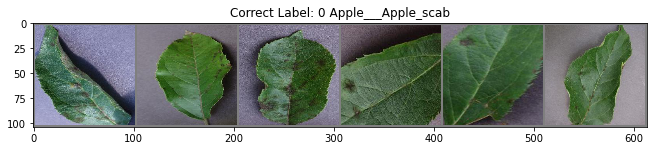

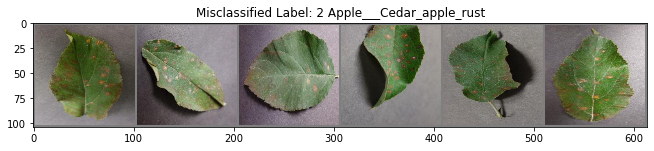

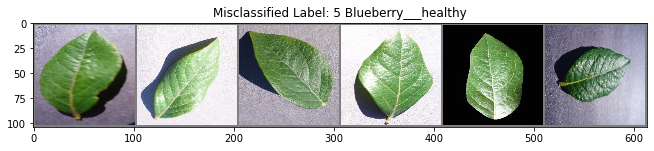

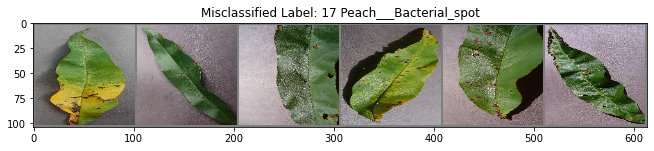

In [103]:
show_misclassified_images_per_labels(0, top_3_mislabeledAlexnet, misclassifiedLabelsAlexnet)

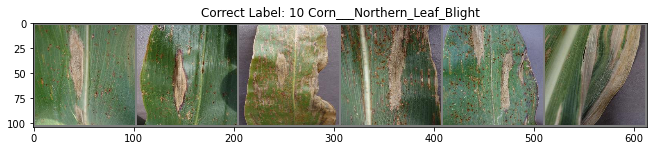

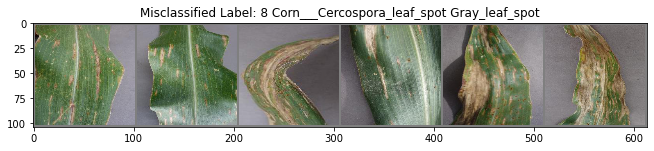

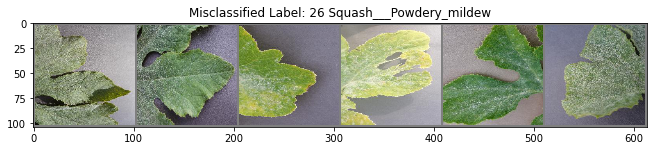

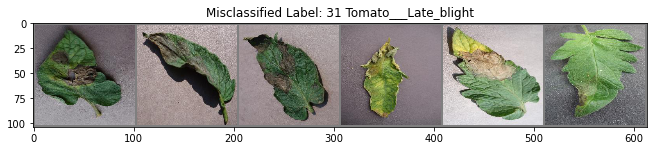

In [104]:
show_misclassified_images_per_labels(10, top_3_mislabeledAlexnet, misclassifiedLabelsAlexnet)

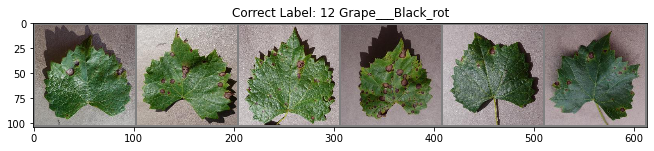

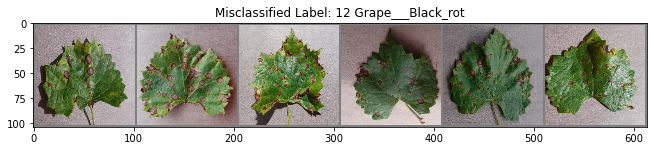

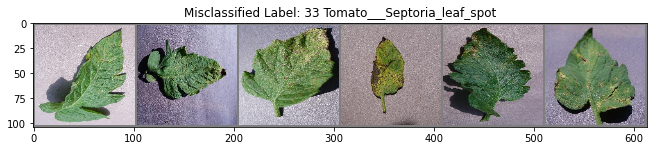

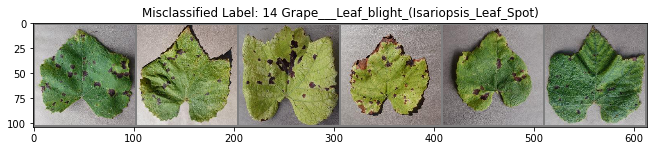

In [105]:
show_misclassified_images_per_labels(12, top_3_mislabeledAlexnet, misclassifiedLabelsAlexnet)

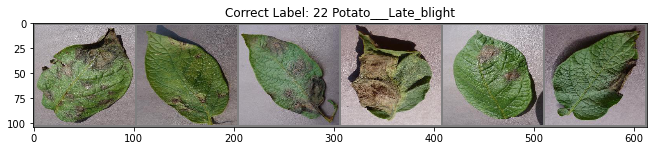

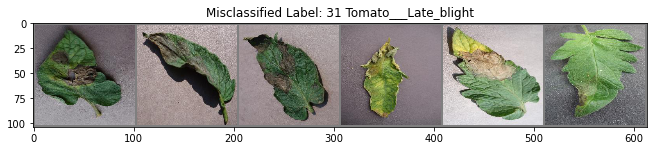

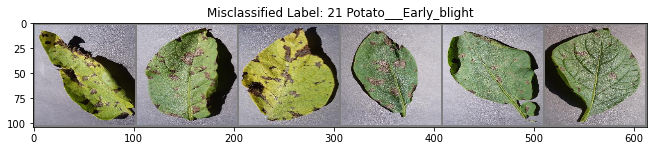

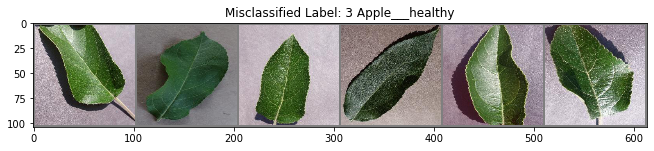

In [106]:
show_misclassified_images_per_labels(22, top_3_mislabeledAlexnet, misclassifiedLabelsAlexnet)

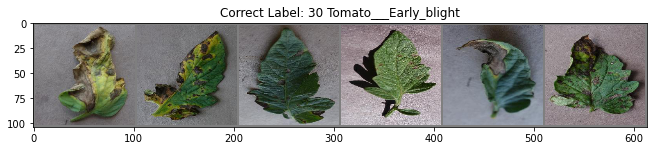

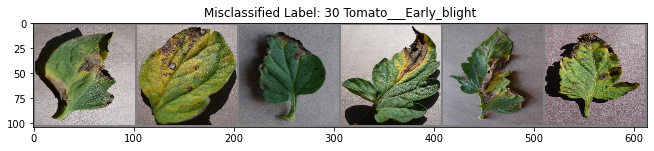

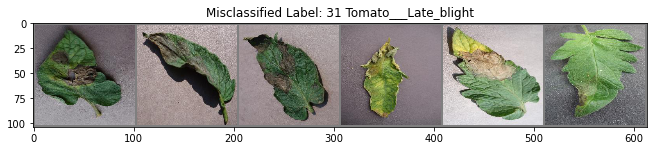

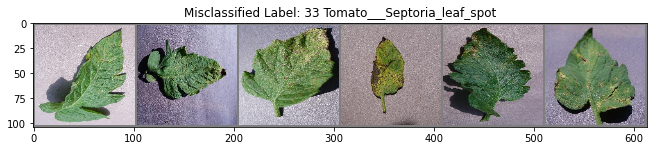

In [107]:
show_misclassified_images_per_labels(30, top_3_mislabeledAlexnet, misclassifiedLabelsAlexnet)

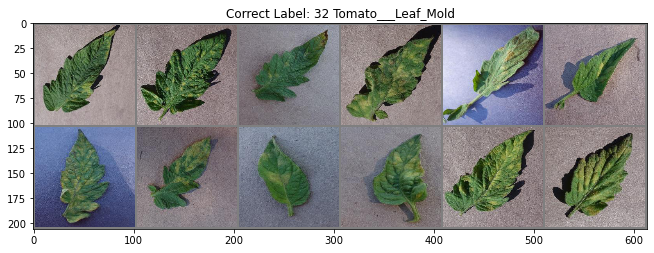

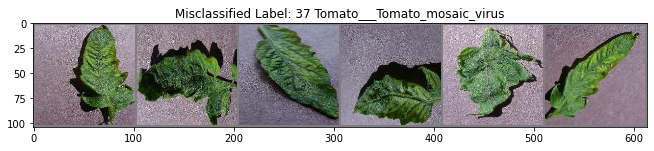

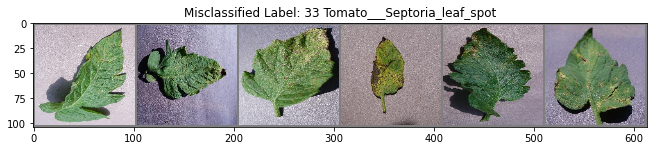

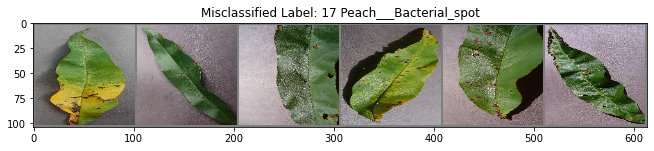

In [108]:
show_misclassified_images_per_labels(32, top_3_mislabeledAlexnet, misclassifiedLabelsAlexnet)

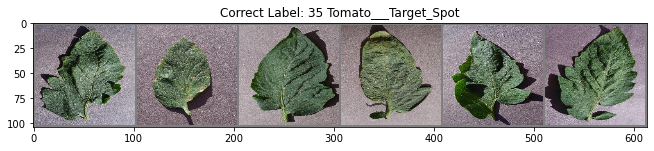

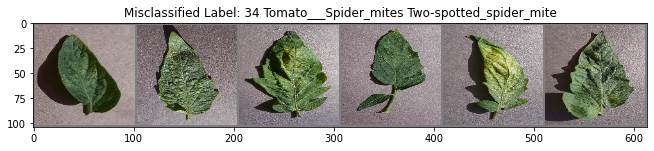

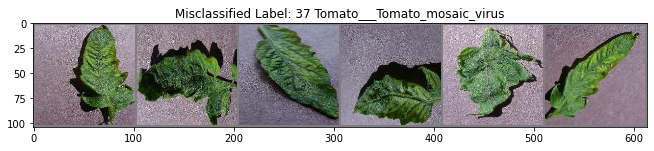

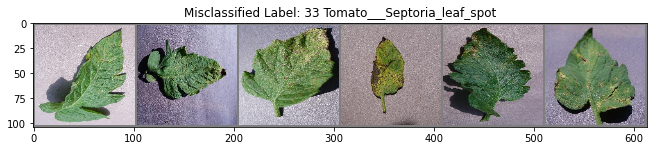

In [109]:
show_misclassified_images_per_labels(35, top_3_mislabeledAlexnet, misclassifiedLabelsAlexnet)

#### Resnet

Correct Labels:   tensor([35,  0, 36, 35, 29, 23, 25, 33, 22, 12, 19,  3], dtype=torch.int32)
Predicted Labels: tensor([38, 28, 37, 38, 31, 24, 23, 14, 30, 13, 20,  0], dtype=torch.int32)

Correct Label: 35 --> Tomato___Target_Spot
Predicted Label: 38 --> Tomato___healthy

Correct Label: 0 --> Apple___Apple_scab
Predicted Label: 28 --> Strawberry___healthy

Correct Label: 36 --> Tomato___Tomato_Yellow_Leaf_Curl_Virus
Predicted Label: 37 --> Tomato___Tomato_mosaic_virus

Correct Label: 35 --> Tomato___Target_Spot
Predicted Label: 38 --> Tomato___healthy

Correct Label: 29 --> Tomato___Bacterial_spot
Predicted Label: 31 --> Tomato___Late_blight

Correct Label: 23 --> Potato___healthy
Predicted Label: 24 --> Raspberry___healthy

Correct Label: 25 --> Soybean___healthy
Predicted Label: 23 --> Potato___healthy

Correct Label: 33 --> Tomato___Septoria_leaf_spot
Predicted Label: 14 --> Grape___Leaf_blight_(Isariopsis_Leaf_Spot)

Correct Label: 22 --> Potato___Late_blight
Predicted Label: 30 -

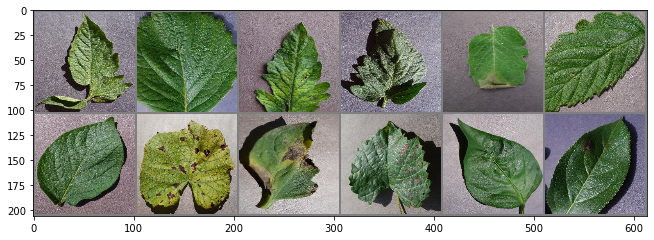

In [110]:
show_misclassified_images(misclassifiedLabelsResnet)

In [111]:
low_accuracy_labels = [0, 30, 31, 32, 35]

In [112]:
top_3_mislabeledResnet = top_misclassified_predicted_labels(confusion_matrix_report_Resnet, low_accuracy_labels)

In [113]:
list_top_3_mislabeled_count(low_accuracy_labels, top_3_mislabeledResnet, confusion_matrix_report_Resnet)

For label 0, Apple___Apple_scab, top three misclassified labels are:
---> Mislabeled: 20 Pepper,_bell___healthy
Count: 5
---> Mislabeled: 3 Apple___healthy
Count: 5
---> Mislabeled: 19 Pepper,_bell___Bacterial_spot
Count: 5

For label 30, Tomato___Early_blight, top three misclassified labels are:
---> Mislabeled: 33 Tomato___Septoria_leaf_spot
Count: 15
---> Mislabeled: 35 Tomato___Target_Spot
Count: 14
---> Mislabeled: 29 Tomato___Bacterial_spot
Count: 13

For label 31, Tomato___Late_blight, top three misclassified labels are:
---> Mislabeled: 33 Tomato___Septoria_leaf_spot
Count: 20
---> Mislabeled: 30 Tomato___Early_blight
Count: 18
---> Mislabeled: 22 Potato___Late_blight
Count: 17

For label 32, Tomato___Leaf_Mold, top three misclassified labels are:
---> Mislabeled: 33 Tomato___Septoria_leaf_spot
Count: 18
---> Mislabeled: 37 Tomato___Tomato_mosaic_virus
Count: 12
---> Mislabeled: 30 Tomato___Early_blight
Count: 8

For label 35, Tomato___Target_Spot, top three misclassified label

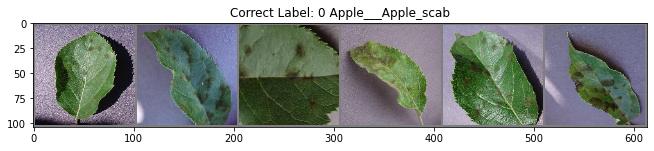

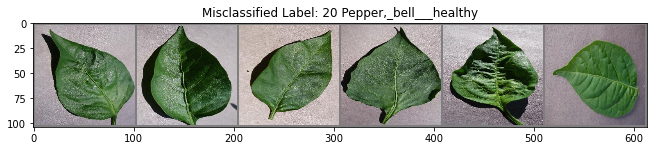

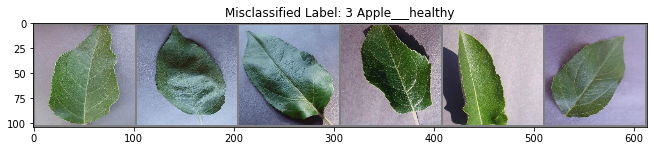

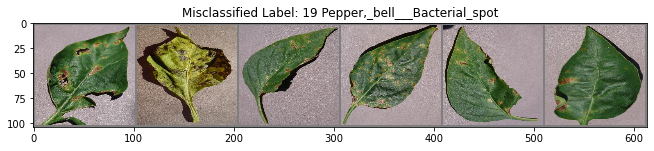

In [114]:
show_misclassified_images_per_labels(0, top_3_mislabeledResnet, misclassifiedLabelsResnet)

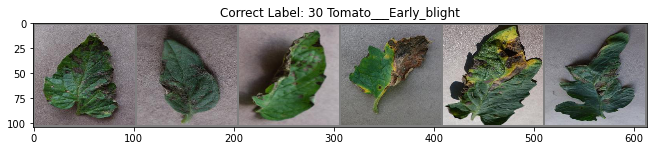

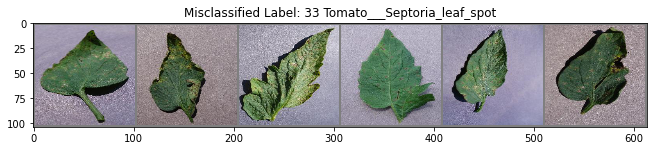

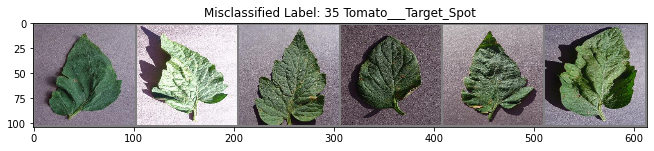

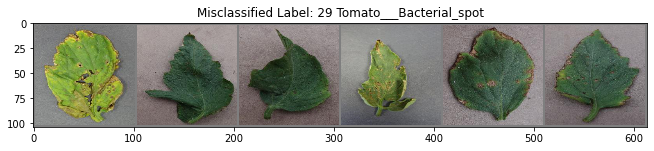

In [115]:
show_misclassified_images_per_labels(30, top_3_mislabeledResnet, misclassifiedLabelsResnet)

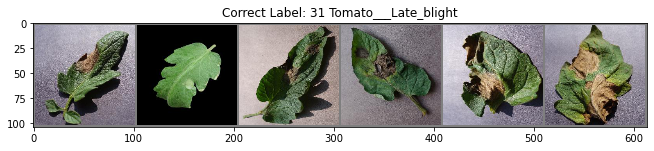

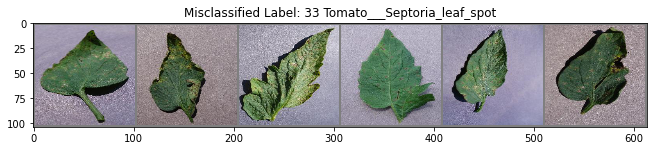

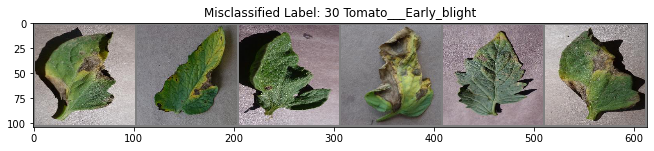

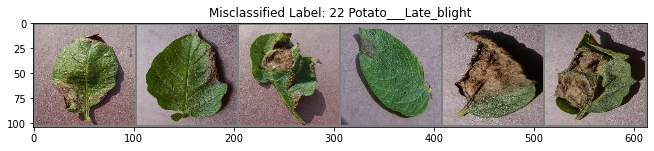

In [116]:
show_misclassified_images_per_labels(31, top_3_mislabeledResnet, misclassifiedLabelsResnet)

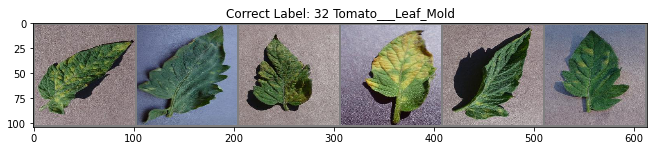

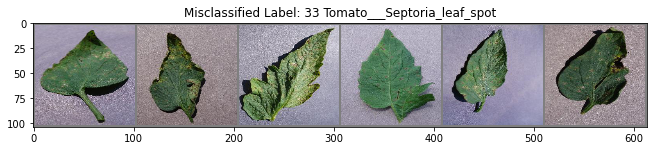

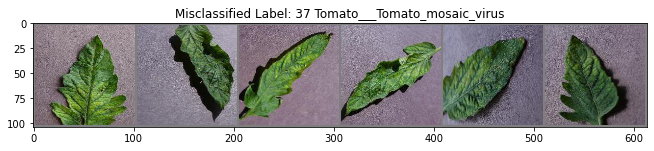

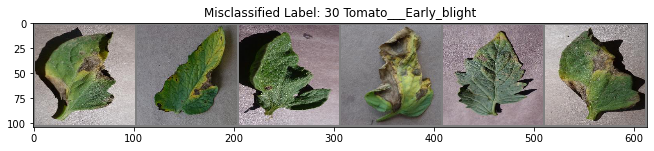

In [117]:
show_misclassified_images_per_labels(32, top_3_mislabeledResnet, misclassifiedLabelsResnet)

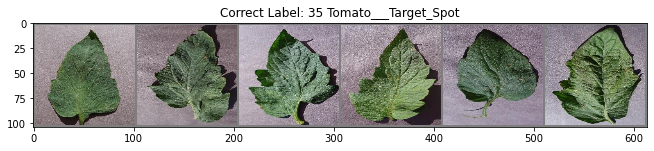

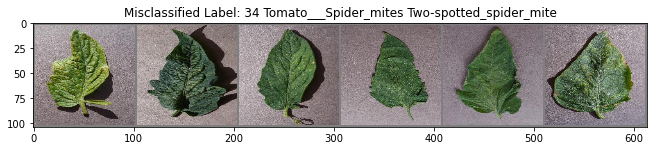

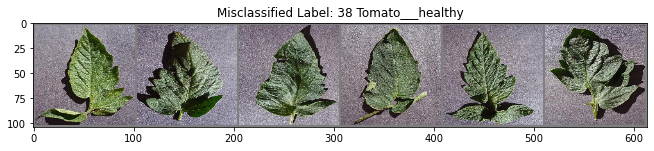

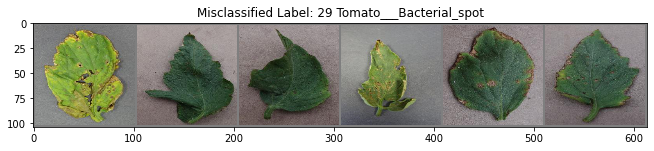

In [118]:
show_misclassified_images_per_labels(35, top_3_mislabeledResnet, misclassifiedLabelsResnet)